$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\cset}[1]{\mathcal{#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
\newcommand{\E}[2][]{\mathbb{E}_{#1}\left[#2\right]}
\newcommand{\ip}[3]{\left<#1,#2\right>_{#3}}
\newcommand{\given}[]{\,\middle\vert\,}
\newcommand{\DKL}[2]{\cset{D}_{\text{KL}}\left(#1\,\Vert\, #2\right)}
\newcommand{\grad}[]{\nabla}
$$

# Part 1: Mini-Project
<a id=part3></a>

In this part you'll implement a small comparative-analysis project, heavily based on the materials from the tutorials and homework.

### Guidelines

- You should implement the code which displays your results in this notebook, and add any additional code files for your implementation in the `project/` directory. You can import these files here, as we do for the homeworks.
- Running this notebook should not perform any training - load your results from some output files and display them here. The notebook must be runnable from start to end without errors.
- You must include a detailed write-up (in the notebook) of what you implemented and how. 
- Explain the structure of your code and how to run it to reproduce your results.
- Explicitly state any external code you used, including built-in pytorch models and code from the course tutorials/homework.
- Analyze your numerical results, explaining **why** you got these results (not just specifying the results).
- Where relevant, place all results in a table or display them using a graph.
- Before submitting, make sure all files which are required to run this notebook are included in the generated submission zip.
- Try to keep the submission file size under 10MB. Do not include model checkpoint files, dataset files, or any other non-essentials files. Instead include your results as images/text files/pickles/etc, and load them for display in this notebook. 

## Object detection on TACO dataset

TACO is a growing image dataset of waste in the wild. It contains images of litter taken under diverse environments: woods, roads and beaches.

<center><img src="imgs/taco.png" /></center>


you can read more about the dataset here: https://github.com/pedropro/TACO

and can explore the data distribution and how to load it from here: https://github.com/pedropro/TACO/blob/master/demo.ipynb


The stable version of the dataset that contain 1500 images and 4787 annotations exist in `datasets/TACO-master`
You do not need to download the dataset.


### Project goals:

* You need to perform Object Detection task, over 7 of the dataset.
* The annotation for object detection can be downloaded from here: https://github.com/wimlds-trojmiasto/detect-waste/tree/main/annotations.
* The data and annotation format is like the COCOAPI: https://github.com/cocodataset/cocoapi (you can find a notebook of how to perform evalutation using it here: https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocoEvalDemo.ipynb)
(you need to install it..)
* if you need a beginner guild for OD in COCOAPI, you can read and watch this link: https://www.neuralception.com/cocodatasetapi/ 

### What do i need to do?

* **Everything is in the game!** as long as your model does not require more then 8 GB of memory and you follow the Guidelines above.


### What does it mean?
* you can use data augmentation, rather take what's implemented in the directory or use external libraries such as https://albumentations.ai/ (notice that when you create your own augmentations you need to change the annotation as well)
* you can use more data if you find it useful (for examples, reviwew https://github.com/AgaMiko/waste-datasets-review)


### What model can i use?
* Whatever you want!
you can review good models for the coco-OD task as a referance:
SOTA: https://paperswithcode.com/sota/object-detection-on-coco
Real-Time: https://paperswithcode.com/sota/real-time-object-detection-on-coco
Or you can use older models like YOLO-V3 or Faster-RCNN
* As long as you have a reason (complexity, speed, preformence), you are golden.

### Tips for a good grade:
* start as simple as possible. dealing with APIs are not the easiest for the first time and i predict that this would be your main issue. only when you have a running model that learn, you can add learning tricks.
* use the visualization of a notebook, as we did over the course, check that your input actually fitting the model, the output is the desired size and so on.
* It is recommanded to change the images to a fixed size, like shown in here :https://github.com/pedropro/TACO/blob/master/detector/inspect_data.ipynb
* Please adress the architecture and your loss function/s in this notebook. if you decided to add some loss component like the Focal loss for instance, try to show the results before and after using it.
* Plot your losses in this notebook, any evaluation metric can be shown as a function of time and possibe to analize per class.

Good luck!

## Implementation

**TODO**: This is where you should write your explanations and implement the code to display the results.
See guidelines about what to include in this section.

______________________________________________________________________________

## Overview

Welcome to our exciting project where we're diving into the world of object detection. We're particularly interested in identifying trash using the TACO dataset, aiming to contribute to environmental sustainability by automating the process of waste categorization. we're all about making the world a cleaner place, one piece of trash at a time!
For this adventure, we've chosen to work with YOLOv8, the latest installment in the YOLO (You Only Look Once) series of object detection models.

### Why YOLOv8?

YOLOv8 is a state-of-the-art object detection model that brings several improvements over its predecessors. It features a C2f module, an advanced layer that combines high-level features with contextual information to enhance detection accuracy. Moreover, YOLOv8 employs an anchor-free model with a decoupled head, allowing it to process object classification and shape regression more efficiently. it also comes with developer-friendly tools, making it easier for us to fine-tune the model to our specific needs.

![YOLOv8 Architecture Diagram](imgs/yolo_v_8_architecture.jpg)

### Key Features of YOLO-v8

1. Focused Learning: YOLOv8 uses specialized loss functions that improve its ability to detect smaller objects, a crucial feature for our project.

2. Versatility: Beyond object detection, YOLOv8 also offers semantic segmentation capabilities, adding another layer of understanding to image analysis.

3. Performance: In benchmark tests, YOLOv8 achieved a 53.9% accuracy rate, outperforming its previous version.

Source: [A COMPREHENSIVE REVIEW OF YOLO: FROM YOLOV1 AND
BEYOND](https://arxiv.org/pdf/2304.00501.pdf)

## TACO Trash-Detection Dataset

Welcome to the world of trash detection! We're using the TACO dataset, with thousands of images featuring 60 types of trash, including plastic bottles, cans, wrappers and more. We've streamlined it even further for this project, focusing on just 7 key classes:

1. Glass
2. Metals and Plastic
3. Non-Recyclable
4. Other
5. Paper
6. Bio
7. Unknown

### Load Data

In the initial phase of this project, we'll leverage data hosted on the course server. The reason for this is to streamline the presentation process. The more complex task of cpoying and manipulating the TACO dataset will be reserved for a separate notebook dedicated to fine-tuning the models whose results will be presented here later on.

In [1]:
from project.utils import *

In [2]:
coco = read_taco_data_from_server()

loading annotations into memory...
Done (t=0.07s)
creating index...
index created!


### A Quick Peek at Class Distribution

Before diving in, let's take a moment to examine how our training set is distributed across these 7 classes. In an ideal world, each class would have an equal share of the spotlight. However, initial observations indicate some variations.

Dataset Overview:
-> Total Categories: 60
-> Total Images: 1500
-> Total Annotations: 4784
Category Distribution:


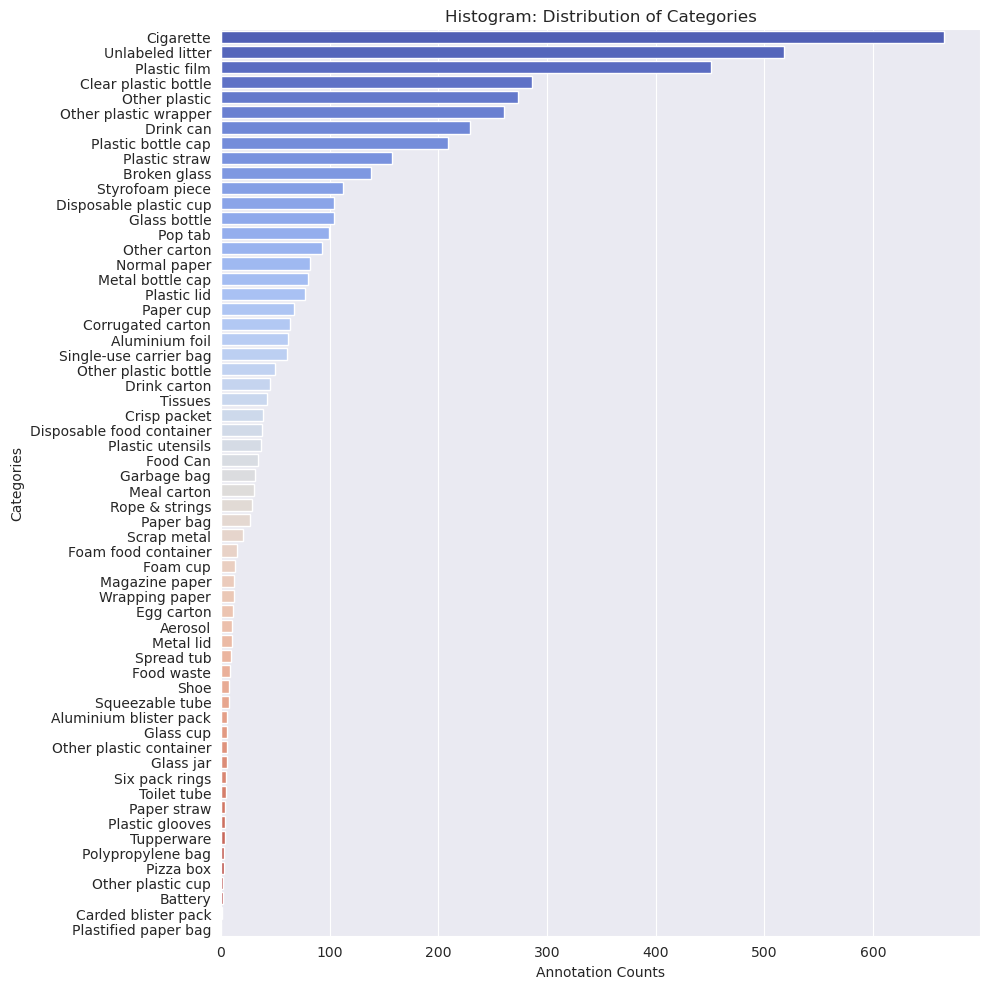

In [3]:
analyze_coco_data(coco)

### What to Expect?

Given this uneven distribution, our model might find it challenging to identify the rarer classes. It's something we're aware of as we move forward with our trash-detecting journey.

## YOLO-v8 Baseline Model

### Code Structure

In [4]:
show_directory_structure()

#### How the Model is created and trained:

- All the code that is relevant for fine-tuning YOLO is in the notebook ./project/YOLOv8/YOLO_Fine_Tuning.ipynb, please take a look - it is user friendly and well explained.

- Data Preparation: Copied the TACO dataset for trash detection. The data was separated into train, validation, and test folders, formatted as required by Ultralytics for YOLOv8 (rather than the initial COCO format). Class labels were mapped to one of the seven categories (60 to 7).

- Package Installation: Installed the Ultralytics package.

- Configuration: Created a config.yaml file specifying the paths to the train, val, and test datasets, as well as the names of the 7 categories.

- Model Training: We called the train_custom_model function from the ./project/YOLOv8/model.py file, which utilizes Ultralytics' train() function.

- Server Execution: Utilized ./project/YOLOv8/yolo.sh and ./project/YOLOv8/main.py to define the server run configurations. The model is run using the terminal command:

        sbatch -o output_file_name.txt -J job_name yolo.sh

#### Baseline Model Configurations:

- Number of Epochs: 100 (300 is recommended, but we are fine-tuning a pre-trained YOLOv8 model on a smaller TACO dataset)
- Batch Size: 16 (default)
- Image Size: [640, 640]
- Pretrained Model: YOLOv8 (pre-trained on COCO among other datasets)
- Data Source: TACO dataset for trash detection with 7 classes.

For other necessary arguments, we used their predefined default settings.
Additional Settings:

- Optimizer: Automatically chosen based on the number of iterations.
- Frozen Layers: None.
- IoU Validation Threshold: 0.6 (relevant for validation, not used at the current stage).

Data Augmentation Techniques:

- Mosaic Augmentation: Combines multiple images into a single mosaic image.
- MixUp: Applies MixUp augmentation by blending two images.
- Random Perspective: Applies random perspective transformations to the image.
- Random HSV: Alters the Hue, Saturation, and Value of the image.
- Random Flip: Applies random horizontal or vertical flips to the image.
- LetterBox: Adds padding to the image to fit a specific aspect ratio.
- Affine Transform: Applies a general linear transformation to the image.

### Evaluation Methodologies:

#### Metrics for Assessment:

The effectiveness of the models generated in each experiment is gauged using the following key indicators:

- Recall - This metric quantifies the proportion of relevant objects accurately identified by the model out of the total number of relevant objects that should have been detected. A high recall score implies that the model successfully recognizes the majority of relevant objects, while a low score suggests otherwise.

  *Recall=True PositivesTrue Positives+False NegativesRecall=True Positives+False NegativesTrue Positives​*

- Precision - This measures the fraction of true positive identifications relative to the sum of true positives and false positives.

  *Precision=True PositivesTrue Positives+False PositivesPrecision=True Positives+False PositivesTrue Positives​*

- mAP (Mean Average Precision) - This is computed by averaging the precision values for each object class in the dataset and then taking the mean. It incorporates both precision and recall and is determined by calculating the area under the precision-recall curve. A higher mAP score signifies superior model performance.

    - mAP@50: This is the mean average precision when an IoU threshold of 0.5 is used to classify a prediction as either a true or false positive.

  - mAP@50-95: This version of mAP uses a range of IoU thresholds from 0.5 to 0.95, incremented by 0.05, to classify predictions.


#### Confusion Matrix:

- Overview - This table encapsulates the model's classification performance by comparing predicted and actual object classes. Each cell in the matrix indicates the likelihood of an object from the true class being classified into a predicted class.

- "Background FN" Category - The column labeled "Background FN" represents instances where the model incorrectly identifies a bounding box as containing trash when it actually doesn't. The corresponding row signifies cases where the model fails to detect an actual trash object. For instance, a value of 1.0 in a cell in the "Background FN" row indicates that the model never detects objects of the corresponding column's class.


#### Visual Assessments:

- To gain a deeper understanding of how the models operate, we also examine visual outputs that juxtapose predicted and ground-truth object identifications. These visual batches are generated by the YOLOv8 algorithm and are stored in the specific experiment's subfolder within the "results" directory.

## Experiment 1

In the initial phase of our experimentation, we address one of the most fundamental choices in training a deep learning model: selecting the optimizer. The optimizer plays a crucial role in the training process, as it governs how the model updates its parameters in response to the training data. Different optimizers come with their own set of advantages and disadvantages, and the choice of optimizer can significantly impact the model's performance in terms of speed, accuracy, and stability.

For our object detection task using YOLOv8 on the TACO dataset, we consider several popular optimizers, including Stochastic Gradient Descent (SGD), Adam, AdamW, and RMSprop. Each of these optimizers has unique characteristics:

- Stochastic Gradient Descent (SGD): A straightforward yet powerful optimizer that is widely used in various machine learning tasks. It is known for its simplicity and effectiveness but may require careful tuning of hyperparameters like learning rate and momentum.

- Adam: Combines the advantages of two other extensions of stochastic gradient descent: AdaGrad and RMSProp. Adam is often recommended for problems that are large in terms of data and/or parameters.

- AdamW: A variant of Adam that decouples the weight decay from the optimization steps, which can lead to better generalization and faster convergence in some cases.

- RMSprop: Adapts the learning rates during training and is known for its robustness, making it suitable for non-stationary objectives.

The objective of this experiment is to evaluate each optimizer's performance based on key metrics such as mean Average Precision at 50% IoU (mAP50), precision, and recall. The motivation behind this experiment is to identify the optimizer that not only accelerates the convergence of the model but also maximizes its predictive accuracy. The results of this experiment will set the stage for subsequent phases of hyperparameter tuning and model refinement, ensuring that we build upon a solid foundation.

**Note: The analysis for this initial experiment will be comprehensive and detailed, as it serves as a foundational piece for understanding our approach and decision-making process throughout this project. In subsequent analyses, we will adopt a more streamlined and intuitive presentation. So, there's no need to worry - this level of detail is exceptional and not the norm for the entire project.**

### Results

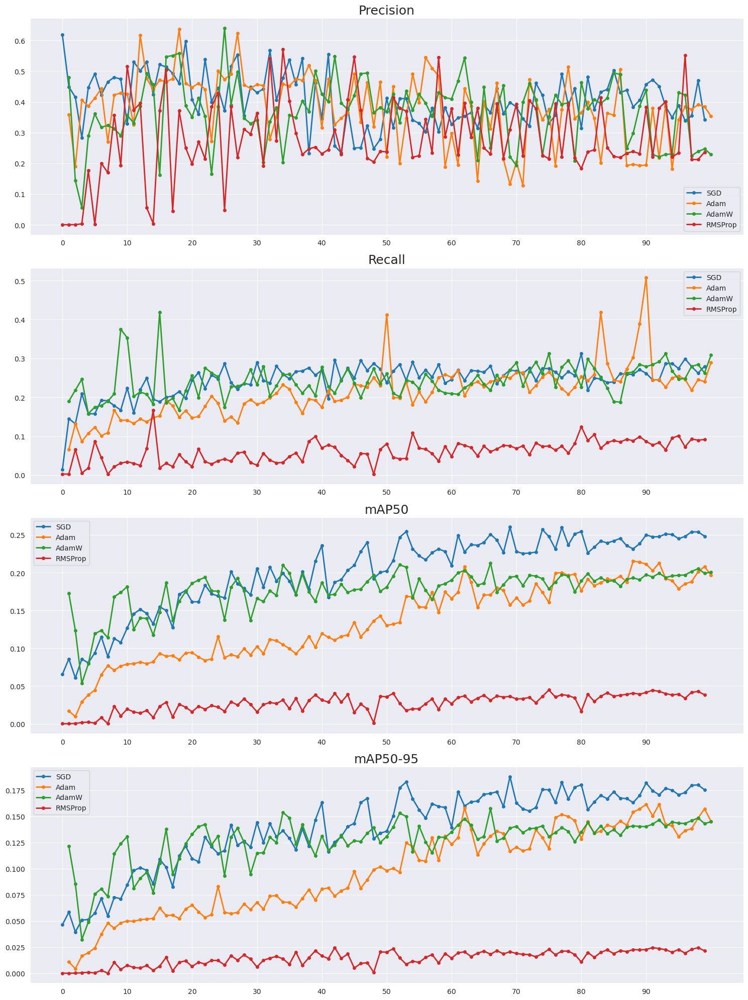

In [5]:
display_optimizers_experiment_metrics()

### Observations

In the evaluation of various machine learning optimizers across multiple metrics, the results present a nuanced picture. When it comes to Precision, the plot is rather inconclusive due to its high level of noise and significant oscillations, making it challenging to discern a clear trend among the different optimizers. On the Recall front, RMSProp consistently lags behind its counterparts across all epochs. While there is no definitive pattern among the other optimizers, Stochastic Gradient Descent (SGD) appears to outperform the rest with an average score of around 0.3. The most compelling insights emerge from the Mean Average Precision (MAP) metrics—both MAP50 and MAP50-95. In these categories, SGD clearly takes the lead, achieving approximately 0.25 in MAP50 and 0.175 in MAP50-95. AdamW and Adam closely follow, registering nearly identical scores of about 0.2 in MAP50 and 0.15 in MAP50-95. RMSProp, however, trails significantly with dismal scores of 0.05 in MAP50 and 0.025 in MAP50-95. Despite a thorough investigation, the underlying reason for RMSProp's poor performance remains elusive.

Having thoroughly evaluated the performance of our optimizers using the above metrics, we have gained some  insights into the optimizers respective strengths and weaknesses. SGD has emerged as the most promising optimizer based on these criteria. However, to ensure a more comprehensive understanding of our model's performance, it is prudent to employ additional evaluation techniques.

Next, we will delve into the use of a Confusion Matrix as an evaluation tool. The Confusion Matrix will provide us with a more granular view of the model's performance by breaking down the True Positives, True Negatives, False Positives, and False Negatives. This will allow us to further validate our initial findings and make more informed decisions moving forward.

### Confusion Matrix - YOLOv8 with SGD Optimizer and default parameters

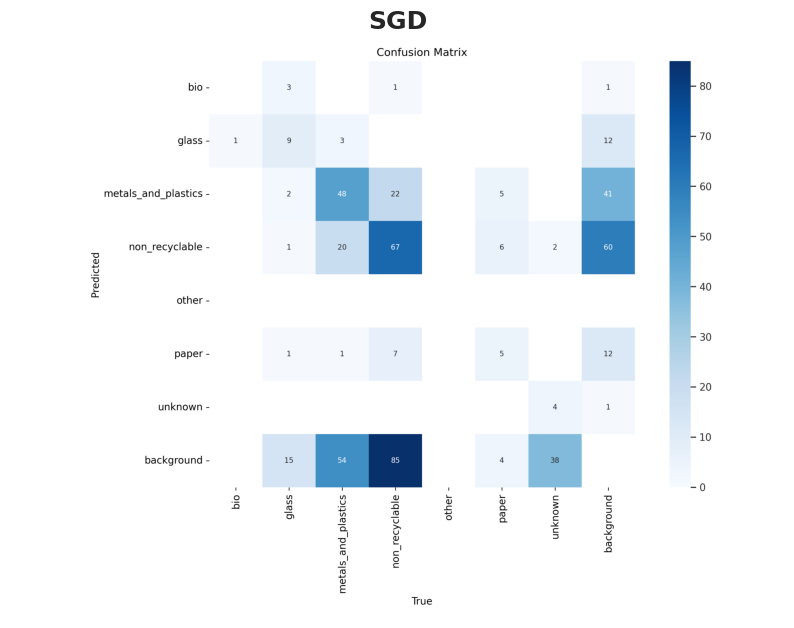

In [6]:
display_confusion_matrices(os.path.join(os.getcwd(), 'results/Optimizers_exp/SGD2'), 'SGD')

### Confusion Matrix - YOLOv8 with Adam Optimizer and default parameters

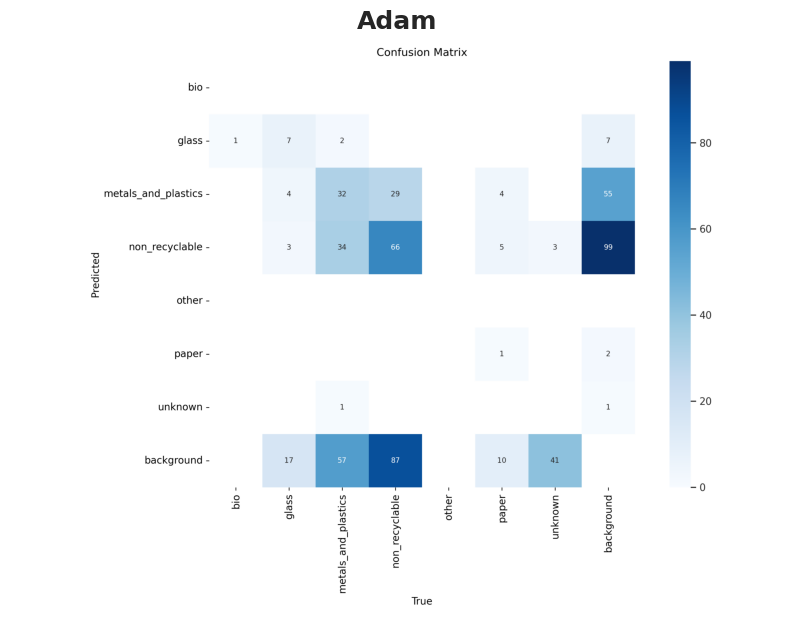

In [7]:
display_confusion_matrices(os.path.join(os.getcwd(), 'results/Optimizers_exp/Adam'), 'Adam')

### Confusion Matrix - YOLOv8 with AdamW Optimizer and default parameters

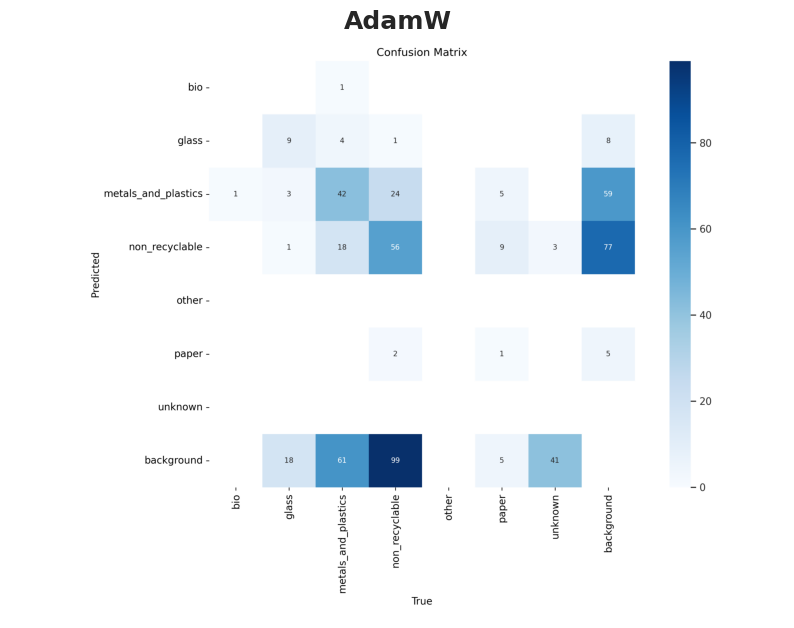

In [8]:
display_confusion_matrices(os.path.join(os.getcwd(), 'results/Optimizers_exp/AdamW'), 'AdamW')

### Confusion Matrix - YOLOv8 with RMSProp Optimizer and default parameters

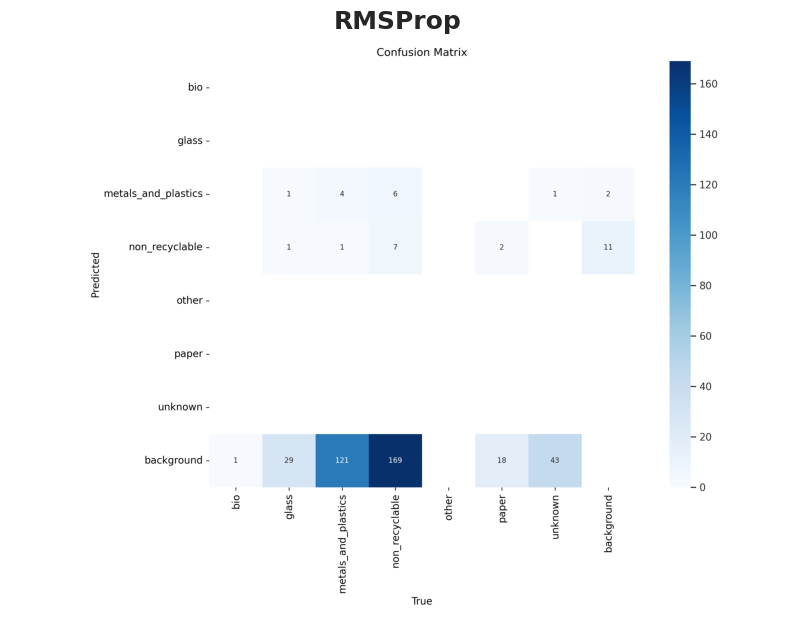

In [9]:
display_confusion_matrices(os.path.join(os.getcwd(), 'results/Optimizers_exp/RMSProp2'), 'RMSProp')

### Observations

**1. Poor Performance of RMSProp:**
- Consistency with Previous Metrics: The subpar performance of RMSProp in the confusion matrix aligns well with its poor showing in earlier plots for recall, precision, and MAP scores. This consistency across different evaluation metrics raises red flags about its suitability for this particular task.
- Class Confusion: The confusion matrix reveals that RMSProp has a significant issue with class confusion. The highest values being concentrated in the "metals_and_plastic" and "non_recyclable" columns, but only in the "background" row, suggests that the model is misclassifying these specific classes as background noise or vice versa. This is a critical flaw, as it implies that RMSProp is not just underperforming but is fundamentally misunderstanding the task.
- Exaggeration Due to Low Performance: The issue of class confusion is present in all models to some extent, but it becomes glaringly obvious in RMSProp. This is likely because the other values in RMSProp's confusion matrix are so low that these misclassifications stand out more prominently. This could indicate that RMSProp is not only ineffective but also inefficient, as it seems to expend computational resources on incorrect classifications.

**2. Similar Performance of Adam and AdamW:**
- Interchangeability: The near-identical performance of Adam and AdamW, as evidenced by their similar confusion matrices, suggests that for this specific problem, choosing between the two might not significantly impact the model's performance.
- Consistency with Other Metrics: This similarity is not just confined to the confusion matrix but is also observed in other metrics like recall and MAP scores. This consistency adds a layer of reliability to these optimizers, making them a safer bet for general tasks.

**3. Strong Performers in Specific Classes:**
- Significance of Diagonal Elements: The diagonal elements in a confusion matrix represent true positive rates for each class. The fact that "non_recyclable" and "metals_and_plastic" have the highest diagonal elements suggests that these classes are most accurately predicted by the models, as expected from the most represented labels in the data.
- Implications for Real-world Applications: High performance in these categories could be particularly beneficial if these classes are of primary concern in the application domain. For example, correctly identifying "non_recyclable" items could be crucial in waste management systems.
- Consistency Across Models: The strong performance in these classes is not limited to a single optimizer but is a trend observed across multiple models. This could indicate that the features for these classes are more distinguishable, making it easier for various algorithms to correctly classify them.

**4. Impact of Low Sample Size on "Other" Class:**
- Near-Zero Values: As expected, the "other" class, which has a low sample size, shows near-zero values across all confusion matrices. This is a classic symptom of class imbalance, where minority classes are often misclassified or ignored.
- Challenges in Model Training: The low sample size for the "other" class makes it difficult for the model to learn distinguishing features for this category, leading to poor performance. This is a common issue in machine learning and requires techniques like oversampling or synthetic data generation to mitigate.
- Implications for Dataset Quality: The near-zero values for the "other" class serve as a reminder that the quality of a machine learning model is often closely tied to the quality and balance of the dataset it is trained on. Addressing this imbalance could lead to more robust and accurate models.

**5. Individual Performance Metrics:**

- SGD: This optimizer excels in predicting the "non_recyclable" and "metals_and_plastic" classes, with scores of 67 and 48, respectively. These numbers suggest that SGD is particularly robust and effective for these categories.

- Adam: Performs similarly but slightly lower than SGD, with scores of 66 and 32 for "non_recyclable" and "metals_and_plastic," respectively.

- AdamW: Also performs well but not as good as SGD, with scores of 56 and 42 for "non_recyclable" and "metals_and_plastic," respectively.

In summary, **SGD** emerges as the most reliable optimizer, particularly for the "non_recyclable" and "metals_and_plastic" classes.

**Below, we showcase a series of annotated images, to provide a visual assessment of each optimizer's performance. This will help us make a more informed decision on which optimizer is best suited for our task**

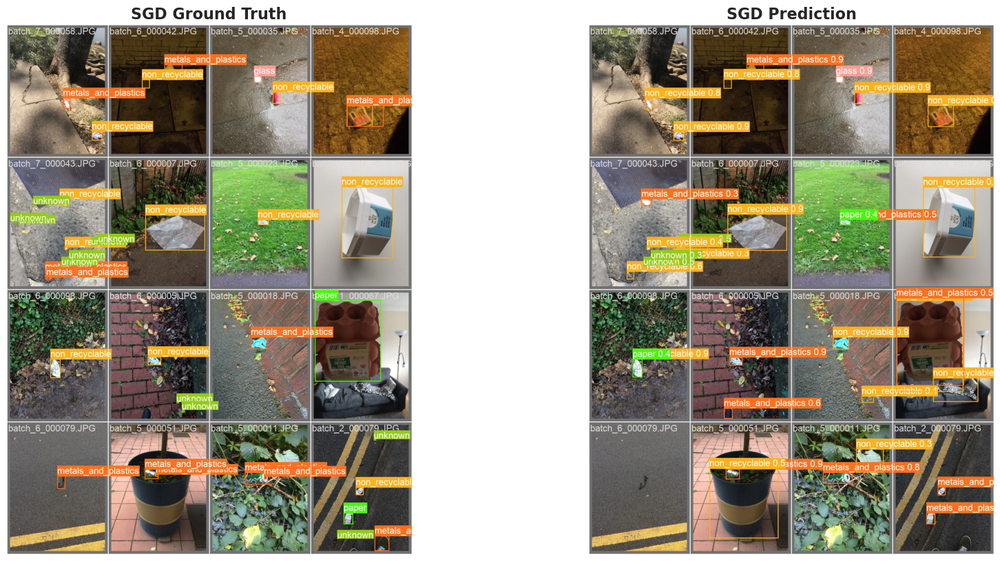

In [10]:
display_val_images(os.path.join(os.getcwd(), 'results/Optimizers_exp/SGD2'), 'SGD')

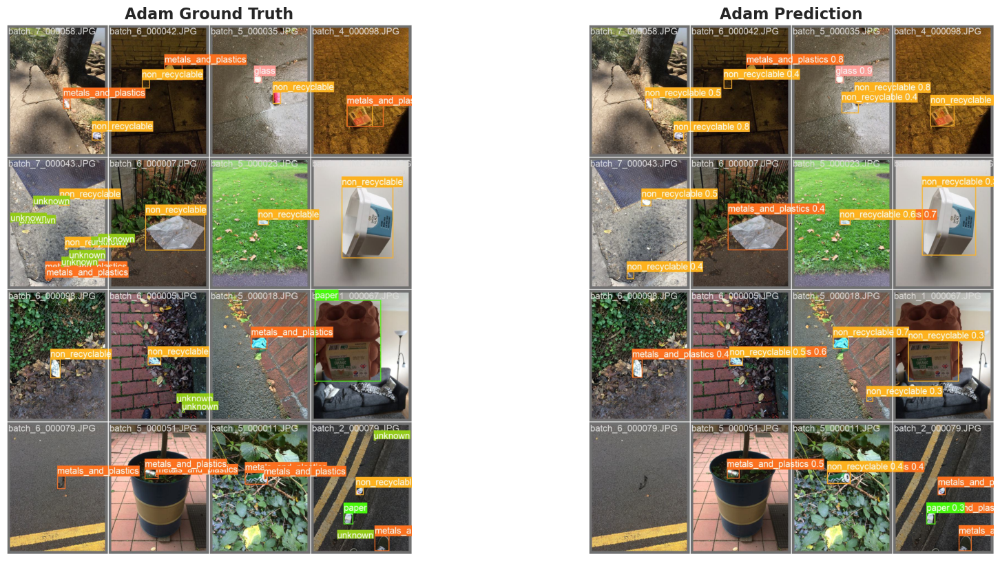

In [11]:
display_val_images(os.path.join(os.getcwd(), 'results/Optimizers_exp/Adam'), 'Adam')

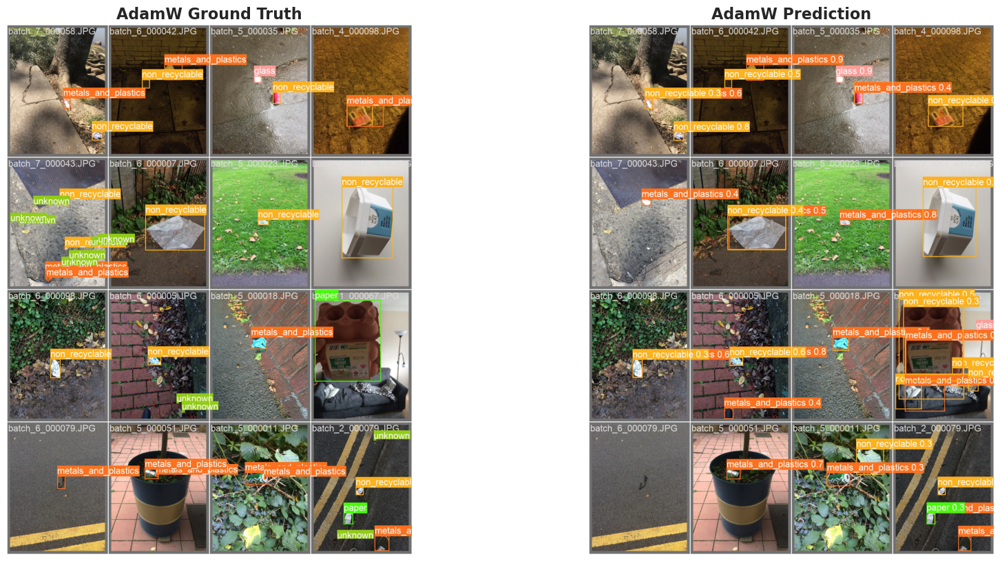

In [12]:
display_val_images(os.path.join(os.getcwd(), 'results/Optimizers_exp/AdamW'), 'AdamW')

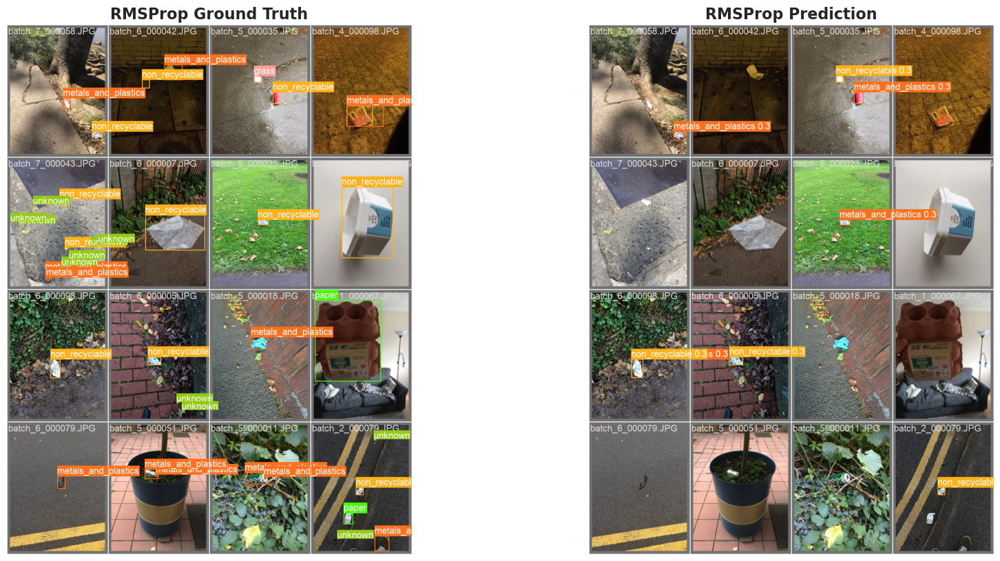

In [13]:
display_val_images(os.path.join(os.getcwd(), 'results/Optimizers_exp/RMSProp2'), 'RMSProp')

### Experiment 1 - Conlusions

As previously detailed and further corroborated by the visual inspection of the above annotated images, SGD emerges as the most suitable optimizer for our project.

## Experiment 2

In this phase of our experimentation, we delve into the fine-tuning of critical hyperparameters to optimize the performance of our YOLOv8 model on the TACO dataset. Having determined in the first experiment that Stochastic Gradient Descent (SGD) is the most effective optimizer for our task, we now focus on three key hyperparameters: learning rate (lr0), momentum, and batch size.

- Learning Rate (lr0): The learning rate controls the step size during the optimization process. A high learning rate may cause the model to converge quickly but risk overshooting the optimal solution. Conversely, a low learning rate may result in a more accurate model but at the cost of longer training time.

- Momentum: This parameter helps the optimizer navigate through local minima and speeds up convergence by taking into account past gradients. A high momentum value can accelerate learning but may also lead to oscillations, while a low value may make the learning process more stable but slower.

- Batch Size: The batch size determines the number of samples used in each iteration to update the model's weights. A larger batch size provides a more accurate estimate of the gradient but requires more computational resources. A smaller batch size, on the other hand, may introduce noise in the gradient estimation, potentially leading to less stable training.

The objective of this phase is to identify the optimal combination of these hyperparameters that yield the best performance in terms of key evaluation metrics such as mAP50, precision, and recall. The motivation is twofold: first, to ensure that the model is learning in the most effective and efficient manner, and second, to mitigate risks such as overfitting. By systematically exploring a range of values for each hyperparameter, we aim to find a configuration that strikes an ideal balance between training speed and model accuracy. The results from this phase will serve as the foundation for subsequent experiments, including an investigation into the effects of freezing the backbone layers, thereby ensuring that we are building upon the most optimized model configuration.

### Results

In [14]:
styled_df = display_tuning_experiment_metrics()
styled_df

,train/box_loss,train/cls_loss,train/dfl_loss,precision,recall,mAP50,mAP50-95,val/box_loss,val/cls_loss,val/dfl_loss,batch,momentum,lr0
0,0.856690,0.999770,0.958240,0.346780,0.303510,0.249290,0.174180,1.010100,1.828000,1.099000,8,0.900000,0.010000
1,0.891240,1.204300,0.993160,0.470670,0.309150,0.264210,0.184360,0.986770,1.781300,1.083600,4,0.900000,0.010000
2,0.846600,0.896580,0.958480,0.415020,0.263810,0.251480,0.179130,1.038300,2.004000,1.104300,16,0.900000,0.010000
3,0.978000,1.376200,1.030400,0.440390,0.334520,0.237040,0.171250,1.027500,1.771000,1.133000,8,0.970000,0.010000
4,0.993880,1.569100,1.067000,0.400060,0.291650,0.194960,0.145570,1.027500,1.775700,1.126400,4,0.970000,0.010000
5,0.968810,1.258200,1.015900,0.425000,0.327950,0.233660,0.168830,1.079800,1.820100,1.158800,16,0.970000,0.010000
6,0.907690,1.103500,0.983660,0.451850,0.297480,0.257490,0.190340,0.995450,1.721700,1.083900,8,0.937000,0.010000
7,0.926010,1.323800,1.008800,0.449240,0.355150,0.249530,0.180640,1.004700,1.761500,1.095100,4,0.937000,0.010000
8,0.870670,0.956170,0.973480,0.276160,0.333660,0.245860,0.183000,1.041100,1.870400,1.110400,16,0.937000,0.010000
9,0.889550,1.052300,0.972270,0.346950,0.289180,0.245190,0.182770,0.995490,1.872700,1.094600,8,0.900000,0.015000


### Observations

- Learning Rate (lr0):
      The highest mAP50 score (0.28406) is achieved with a learning rate of 0.001.
      Lower learning rates (0.001) generally seem to perform better in terms of mAP50 compared to higher learning rates (0.01, 0.015).

- Momentum:
      The momentum values don't show a clear trend in terms of mAP50.
      However, a momentum of 0.97 seems to work well with a learning rate of 0.001.

- Batch Size:
      The highest mAP50 score is achieved with a batch size of 8.
      There doesn't seem to be a clear trend between batch size and mAP50, but smaller batch sizes (4, 8) tend to perform better than larger ones (16) when the learning rate is 0.001.

- mAP50-95:
      Similar to mAP50, the highest mAP50-95 score (0.2087) is also achieved with a learning rate of 0.001 and a batch size of 8.

- Validation Losses:
      Lower validation losses (val/box_loss, val/cls_loss, val/dfl_loss) are generally better but they don't strictly correlate with higher mAP50 scores. This suggests that the model might not be overfitting, but it's hard to say without testing data.

**Displayed below is a heatmap that illustrates the impact of varying 'lr0' and 'batch size' on the mAP50 metric, as our analysis indicated that 'momentum' had a negligible effect (thus set to 0.97):**

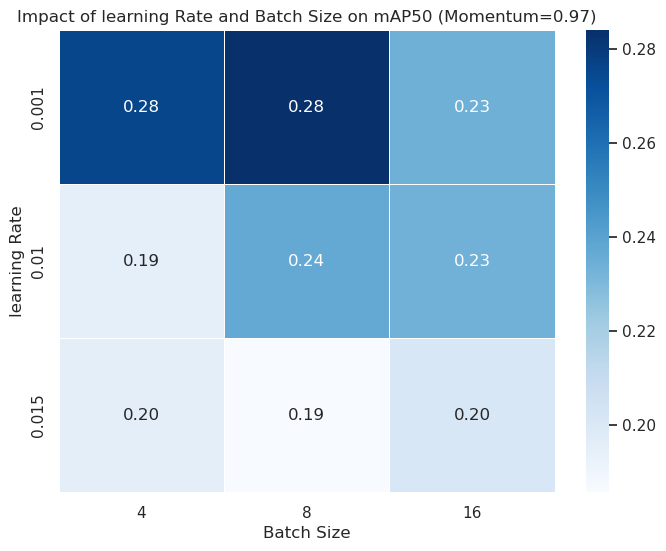

In [15]:
display_tuning_experiment_heatmap()

### Experiment 2 - Conclusions

- Learning Rate:
      A learning rate of 0.001 seems promising and should be considered for testing.

- Momentum:
      A momentum of 0.97 could be a good choice, especially when paired with a learning rate of 0.001.

- Batch Size:
      A batch size of 8 seems to be a good choice based on the highest mAP50 and mAP50-95 scores.

#### Final Configuration:

Based on these observations, a configuration with lr0=0.001, momentum=0.97, and batch size=8 could be a good candidate for upcoming further experiments.

**Below, you'll find the metric results obtained from training with our selected configuration, which includes the previously chosen SGD optimizer. Additionally, we present annotated images to visually demonstrate the model's detection capabilities.**

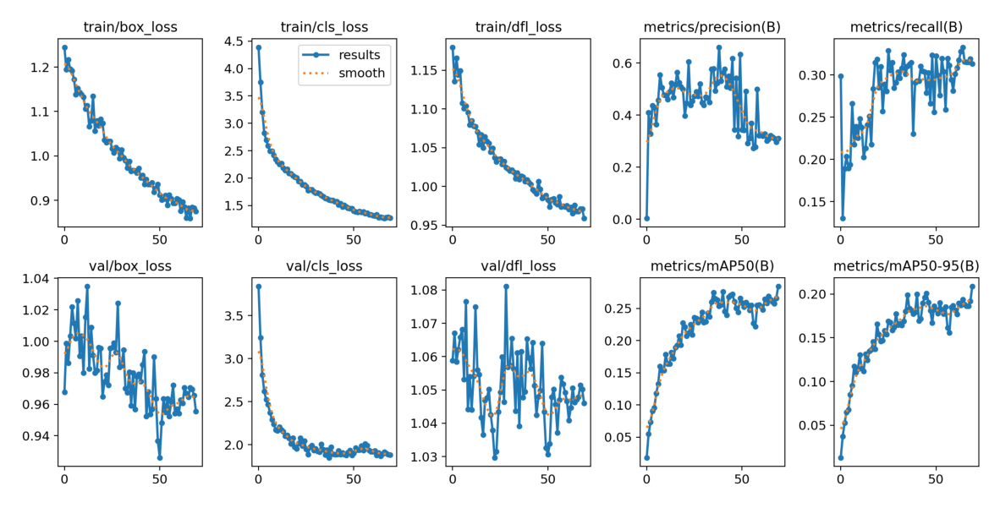

In [16]:
display_tuning_experiment_chosen_metrics()

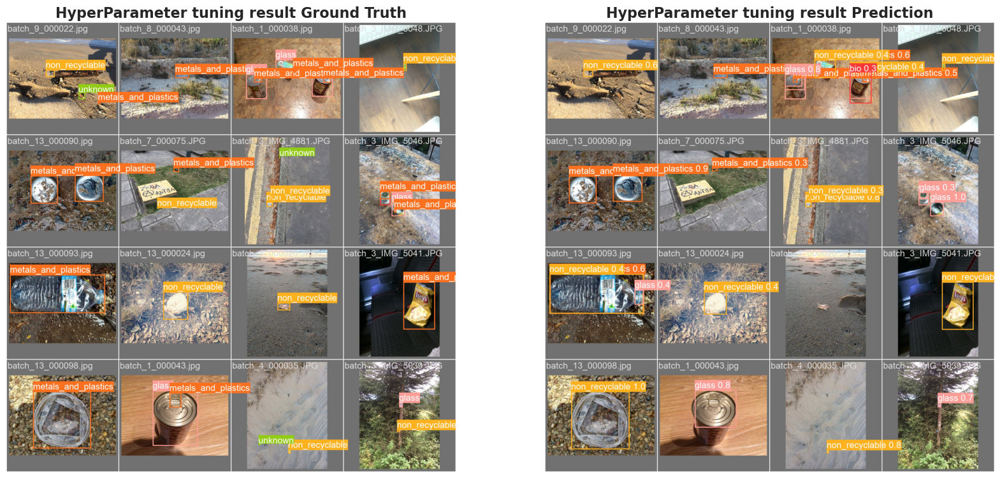

In [17]:
display_tuning_experiment_val_images()

## Experiment 3

In this phase of our experimentation, we aim to investigate the impact of freezing the backbone layers on the performance of our YOLOv8 model fine-tuned on the TACO dataset. The motivation behind this experiment stems from the hypothesis that freezing the backbone layers, which are generally responsible for feature extraction, could potentially expedite the training process without significantly compromising the model's performance. This is particularly relevant when fine-tuning a pre-trained model, as the backbone layers have already been trained on a large dataset to capture general features. By keeping these layers constant, we can focus the training on the task-specific layers, thereby optimizing for our specific objective more efficiently. To ensure a fair comparison, we will use the optimal hyperparameters - learning rate, batch size, and momentum (and SGD optimizer) - identified in previous experiments for both the frozen and unfrozen configurations. The results of this experiment will provide valuable insights into the trade-offs between training efficiency and model performance, guiding us in making more informed decisions for deployment scenarios where computational resources may be limited.

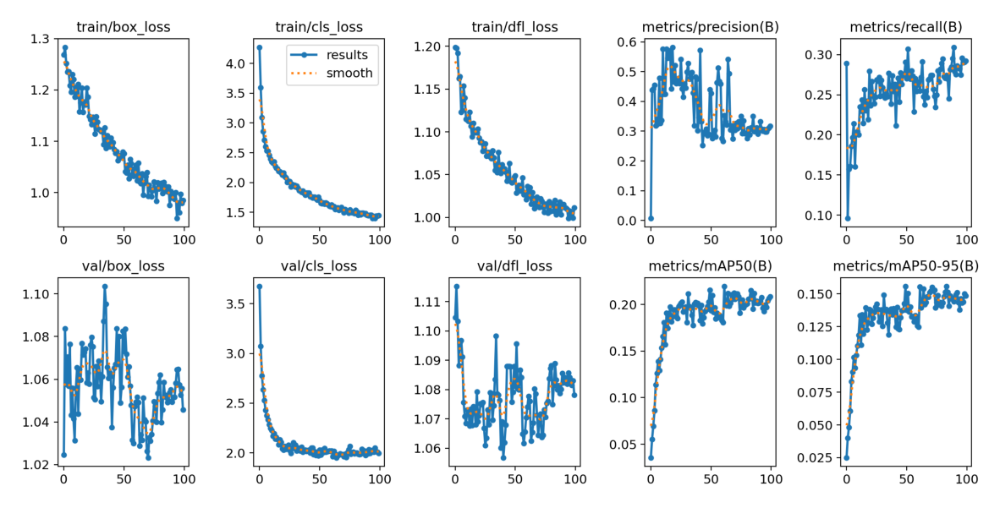

In [18]:
display_freezing_experiment_chosen_metrics()

### Observations

**Comparisons are made against the final graphs and data from the prior experiment (no freezing).**

1. Training Loss: The frozen backbone model seems to have slightly higher training losses (train/box_loss, train/cls_loss, train/dfl_loss) compared to the non-freezing model. This could indicate that the frozen backbone model is less flexible in adapting to the training data.

2. Validation Loss: Similar to the training loss, the frozen backbone model also shows slightly higher validation losses (val/box_loss, val/cls_loss, val/dfl_loss).

3. Precision and Recall: The frozen backbone model has higher precision but lower recall compared to the non-freezing model. This suggests that the frozen backbone model is more conservative in making positive identifications but is more accurate when it does.

4. mAP (Mean Average Precision): The model that doesn't freeze appears to outperform in mAP metrics, albeit by a pretty narrow margin.

**Following this, we showcase images with annotations to illustrate the detection skills of the model that employs frozen backbone layers. We also provide confusion matrices for both the model with frozen backbone layers and the standard model to facilitate deeper analysis.**

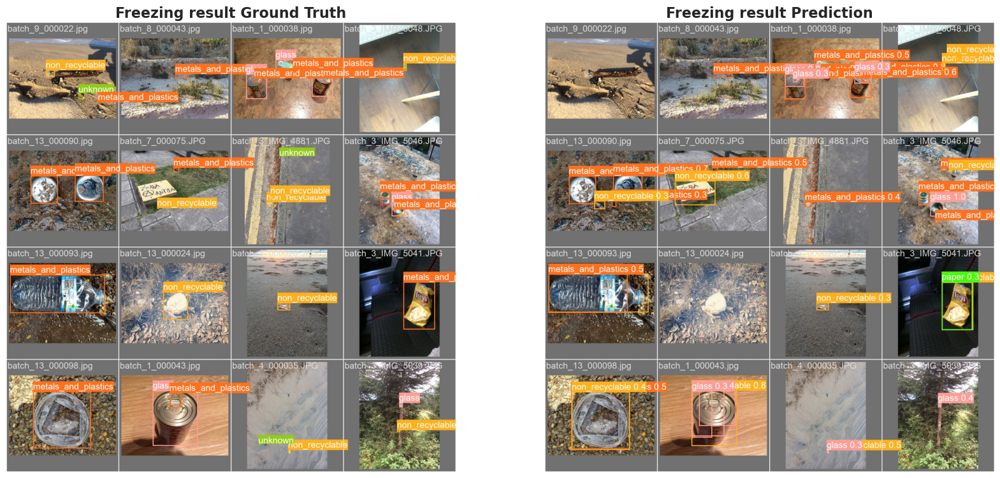

In [19]:
display_freezing_experiment_val_images()

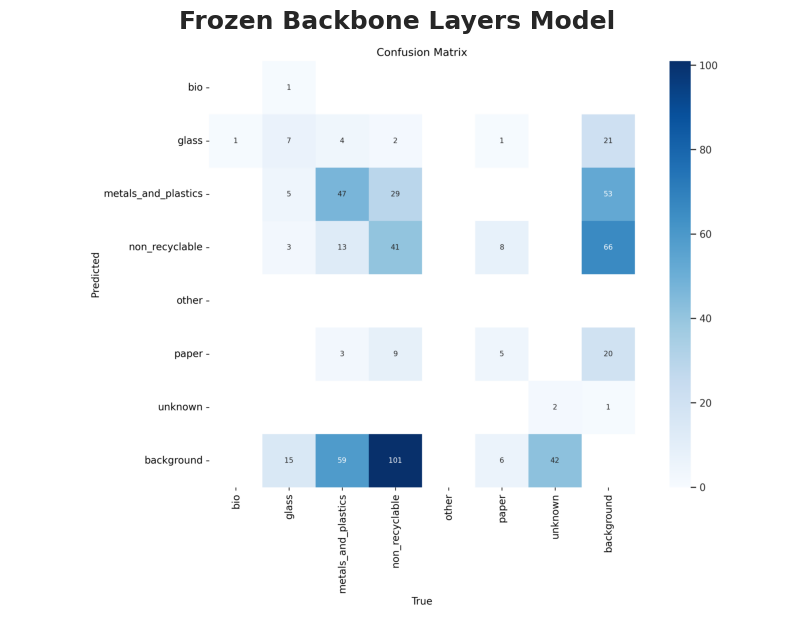

In [20]:
display_confusion_matrices(os.path.join(os.getcwd(), 'results/Freezing_layers_exp/frozen_yolo_SGD_lr0_0.001_momentum_0.97_batch_83'), 'Frozen Backbone Layers Model')

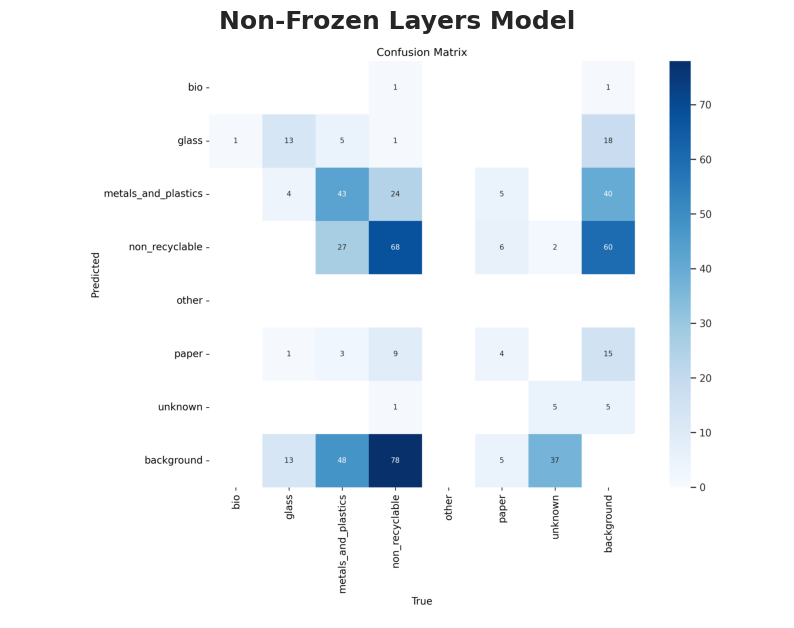

In [21]:
display_confusion_matrices(os.path.join(os.getcwd(), 'results/HyperParams_tuning_exp/lr_0.001_momentum_0.97_batch_size_82'), 'Non-Frozen Layers Model')

### Observations

The two confusion matrices exhibit striking similarities, but there are noteworthy distinctions that merit further investigation:

- In the model without frozen backbone layers, the diagonal entry corresponding to the 'non_recyclable' label is significantly higher, registering at 68 compared to 41 in the alternative model. This suggests that the non-frozen model is more adept at correctly classifying 'non_recyclable' items, which could be indicative of its superior performance in handling more complex or ambiguous classifications.

- In the model with frozen backbone layers, the entries in the final row, which corresponds to the 'background' label, are markedly elevated in the 'metals_and_plastics' and 'non_recyclable' columns. These values substantially exceed those in the non-frozen model. This could imply that the frozen backbone model is more sensitive to background noise when dealing with these particular categories, potentially leading to higher false positives or misclassifications.

### Experiment 3 - Conclusions

Based on the insights gleaned from the confusion matrices and performance metrics, we find the non-frozen model to be more promising for accurate classifications, particularly in the 'non_recyclable' category. Therefore, we recommend advancing this model to the testing phase for a more comprehensive evaluation of its capabilities. However, it's worth noting that if we are dealing with significantly larger datasets, the frozen model could be a viable alternative. While there may be a slight compromise in classification accuracy, the resource efficiency of the frozen model could make it a more practical choice without sacrificing too much in terms of performance.

## Testing

After an exhaustive series of experiments, including the optimization of various parameters and the evaluation of models with and without frozen backbone layers, we have arrived at the testing phase. Our aim is to validate the robustness and generalizability of our chosen model—specifically, the non-frozen model optimized with SGD.

In the notebook located at ./project/YOLOv8/YOLO_Fine_Tuning.ipynb, where we initially prepared the dataset for training, we also allocated a portion for testing. We are now poised to utilize this test split.

From a technical standpoint, the execution process remains consistent with our previous approach; we'll simply run the aforementioned notebook, which conveniently contains all the experiment details for user reference.

Unlike before, where results were stored in the ./results directory, this time they will be saved in a dedicated ./tests folder within the main project directory. The outcomes will be presented here in a similar format as previous reports.

### Results

In [22]:
styled_df = display_testing_metrics()
styled_df

,Metric,Value
0,precision,0.324566
1,recall,0.396276
2,mAP50,0.203607
3,mAP50-95,0.162624
4,fitness,0.166722


- Precision: The precision improved from 0.31053 during training to 0.324566 in the testing phase. This suggests that the model has become more accurate in identifying true positives, thereby reducing the number of false positives. This is a positive indicator of the model's generalization capabilities.

- Recall: The recall also saw an improvement, moving from 0.31309 in training to 0.396276 in testing. This indicates that the model is now better at capturing relevant objects in the scene, which is a significant step forward.

- mAP50: The Mean Average Precision at 50% IoU actually decreased from 0.28406 in training to 0.203607 in testing. While this might seem like a decline, it's essential to consider that testing metrics are often more conservative estimates of performance. The fact that the mAP50 is still in a comparable range is a good sign.

- mAP50-95: This metric went from 0.2087 in training to 0.162624 in testing. Again, while this may appear to be a decrease, it's not uncommon for this metric to be lower in a more challenging, unseen test set. The fact that it remains in a similar ballpark suggests that the model is robust across different IoU thresholds.

- Overall: The model's performance in the testing phase is commendable, especially considering the typical drop-off that occurs when transitioning from a training to a testing environment. The improvements in precision and recall are particularly promising, indicating that the model is not only becoming more accurate but also more comprehensive in its detections.

**Below, we present annotated images to visually demonstrate the tested model's detection capabilities.**

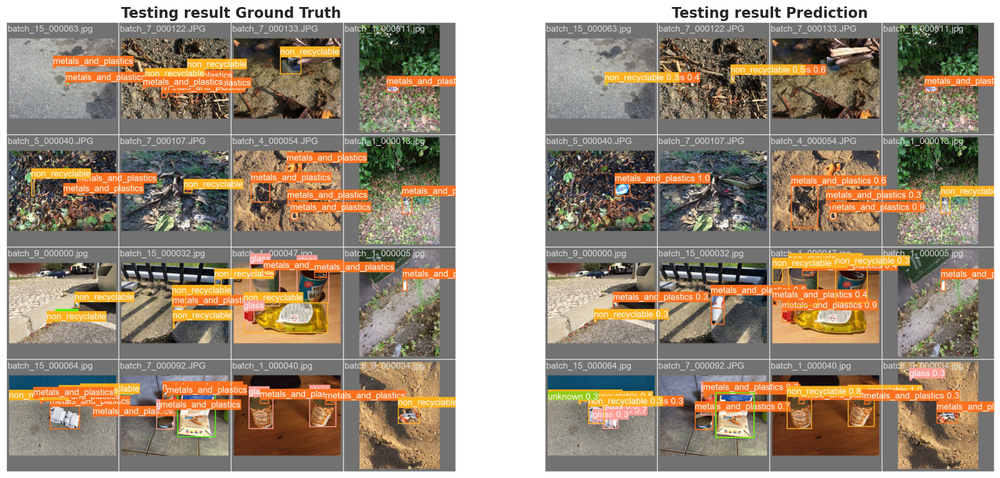

In [23]:
display_testing_images()

*After reviewing the annotated images generated during the testing phase, we happily state that the results have exceeded our expectations. The model's performance in both precision and recall, as well as its ability to accurately detect and classify objects, has affirmed our confidence in its capabilities. We are extremely pleased with these outcomes.*

## IoU thresholds Analysis

In order to understand the robustness and sensitivity of our YOLOv8 model trained on the TACO dataset, we conducted an experiment exploring the effects of varying IoU thresholds on the test set. It's important to note that this is not an exercise in tuning the model based on test set performance, but rather an analysis to understand how different IoU thresholds impact the model's evaluation metrics. By doing so, we aim to gain insights into the trade-offs involved, such as how a lower IoU threshold might increase recall at the expense of precision, or vice versa. This will provide a more comprehensive view of the model's capabilities and limitations, allowing for more informed decisions when deploying the model in real-world applications.

### Results

In [24]:
styled_df = display_IoU_analysis_metrics()
styled_df

,Metric,IoU - 0.3,IoU - 0.4,IoU - 0.5,IoU - 0.6,IoU - 0.7,IoU - 0.8,IoU - 0.9
0,precision,0.334412,0.332324,0.329649,0.324566,0.320496,0.317854,0.297126
1,recall,0.402258,0.403174,0.404126,0.396276,0.397371,0.397240,0.398025
2,mAP50,0.205487,0.205334,0.205126,0.203607,0.201052,0.197812,0.189117
3,mAP50-95,0.163227,0.162931,0.163234,0.162624,0.161390,0.159539,0.154637


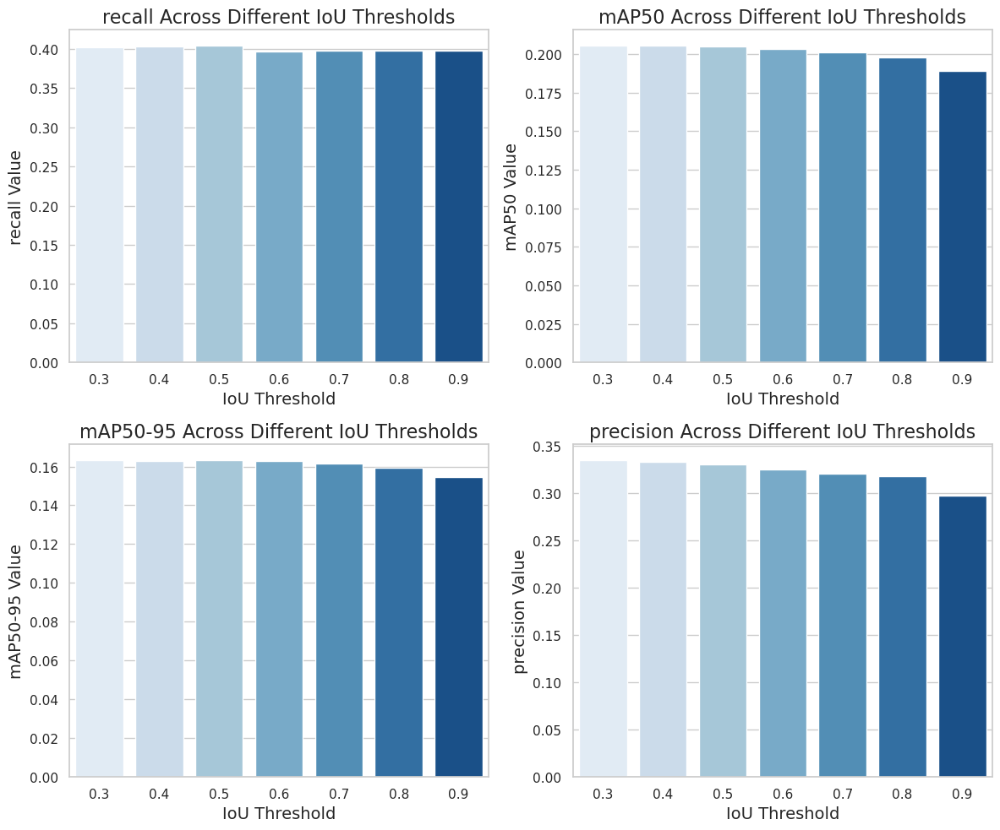

In [25]:
display_IoU_analyis_bars()

### Observations

 As the IoU threshold increases from 0.3 to 0.9, we observe a subtle decline in precision, from 0.334412 to 0.297126, indicating that the model becomes slightly less confident in its detections. Interestingly, recall remains relatively stable across the range, hovering around the 0.4 mark, suggesting that the model maintains its ability to identify true positives even as the criteria for a 'correct' detection become more stringent. The Mean Average Precision (mAP) at 50% IoU and the more comprehensive mAP50-95 also exhibit a gradual decrease as the IoU threshold rises, reinforcing the notion that higher IoU thresholds make the model more conservative in its predictions. These insights offer a nuanced understanding of the trade-offs involved, such as how increasing the IoU threshold tends to slightly compromise precision without significantly affecting recall. This view of the model's performance across different IoU thresholds could be invaluable for making informed decisions if deploying this model in real-world scenarios.

## Limitations and Considerations:

- Due to computational constraints, we had to limit the number of epochs and batch size, which might have affected the model's convergence and overall performance.

- While we focused on individual components like optimizer parameters at a time, a more exhaustive grid search across multiple hyperparameters (more than just the 3 on which we did) could potentially yield even better results. We instead chose this way since we put most efforts on a thorough analysis.

- The TACO dataset is inherently unbalanced, which poses challenges for any model to generalize well across all classes.

# What's Next?

### ZeroShot? TwoShot?

As we conclude this project, it's essential to look ahead at the exciting possibilities that lie in the realm of object detection. YOLO, being a one-shot model, excels at detecting multiple objects in a single forward pass through the network, offering a blend of speed and accuracy. However, the landscape of object detection is ever-evolving, and integrating other types of models could provide a more holistic solution. Specifically, two-shot models, which separate the tasks of object localization and classification, could offer nuanced advantages. Even more intriguing is the advent of zero-shot models like OwlViT, which can generalize to detect objects they have never seen during training. The grand vision here is to create a sophisticated pipeline that leverages the strengths of zero-shot, one-shot, and two-shot models. A meta-learner could then be trained to optimally weigh the contributions of each model type. While this approach is compelling, it's also resource-intensive. Given the time constraints and the desire to thoroughly explore the capabilities of the YOLO model, I chose to focus on fine-tuning YOLO to achieve robust results. However, I did experiment with OwlViT by running it in inference mode on the TACO dataset, converting YOLO-formatted labels back to textual descriptions. Although the preliminary results were not as promising, it highlighted the potential benefits of fine-tuning such models. This experiment serves as a proof-of-concept and lays the groundwork for future research. For those interested in the OwlViT experiment, the notebook can be found at ./project/OwlViT/OwlViT_Inference.ipynb. As we move forward, the integration of these diverse models remains a tantalizing avenue for future work, promising to push the boundaries of what is achievable in object detection.

# References

[Ultralytics docs](https://docs.ultralytics.com/)

[Ultralytics Github](https://github.com/ultralytics/ultralytics)

[A COMPREHENSIVE REVIEW OF YOLO: FROM YOLOV1 AND
BEYOND](https://arxiv.org/pdf/2304.00501.pdf)

Best of all - [Google](https://www.google.com/)